In [1]:
using Distributions,CSV,DataFrames,StatsPlots,Turing
using ExponentialAnalysis
default(size=(700,300))

# テレビCMの露出をPPLで表現する
- GRPは接触人数である。ある母集団から一定割合の人を選んで戻す、という試行を繰り返すことと等しい。
- したがって視聴率分の試行を連続して行う幾何分布であるといえる。
- しかし幾何分布の場合、pとして与えられるパラメータはひとつの定数である。これに対してGRP投下はpが連続して変化する。
- まずはこのようにpが変化する（一本ずつの視聴率が異なる）GRP投下をPPLで表現する方法を明らかにする

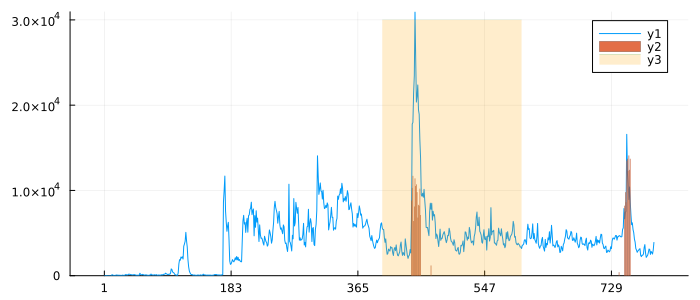

In [2]:
cc_df = CSV.read("data/CCHANNEL_DL_TV.csv", DataFrame)
@df cc_df[:,:] plot(:TTL, xticks=1:182:364*3)
@df cc_df[:,:] bar!(:GRP .* 1e2, lw=0)
plot!(400:600, x->3e4, fill=(0, 0.2, :orange), lw=0)

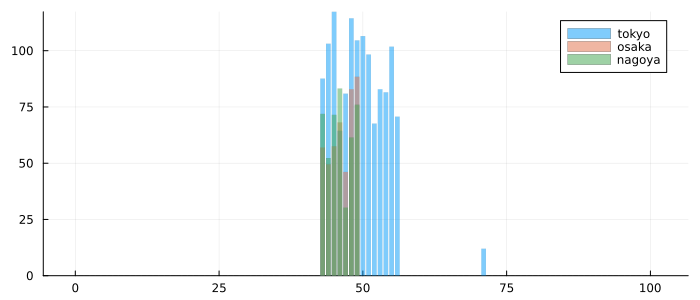

In [6]:
cc3 = CSV.read("data/CCHANNEL_DL_3AREA_400-500.csv", DataFrame)
@df cc3 bar([:GRPT, :GRPO, :GRPN] ,lw=0, alpha=0.5)
ccdl= cc3[:,:TTL] ;
mccgrp=  cc3[:,[:GRPT, :GRPO, :GRPN]] |> Matrix
ms = [43_000_000 , 20_000_000, 10_000_000];
bar(mccgrp, lw=0, alpha=0.5, label=["tokyo" "osaka" "nagoya"])

In [10]:
mod = expmodel(ccdl, mccgrp, ms)

DynamicPPL.Model{typeof(ExponentialAnalysis.expdecompose), (:dl, :grp, :ms), (:K,), (), Tuple{Vector{Int64}, Matrix{Float64}, Vector{Int64}}, Tuple{Int64}, DynamicPPL.DefaultContext}(ExponentialAnalysis.expdecompose, (dl = [5594, 5414, 5415, 4457, 3914, 4320, 3208, 2507, 2600, 3120  …  4775, 4229, 3877, 4180, 4731, 4693, 5562, 5186, 4419, 4039], grp = [0.0 0.0 0.0; 0.0 0.0 0.0; … ; 0.0 0.0 0.0; 0.0 0.0 0.0], ms = [43000000, 20000000, 10000000]), (K = 2,), DynamicPPL.DefaultContext())

In [11]:
ps, chain = analysis(mod)

Sampling   0%|                                          |  ETA: N/A


┌ Info: Found initial step size
│   ϵ = 7.275957614183426e-13
└ @ Turing.Inference /Users/kimseok/.julia/packages/Turing/UCuzt/src/mcmc/hmc.jl:192
Sampling   0%|▎                                         |  ETA: 1:16:19


Sampling   1%|▍                                         |  ETA: 0:38:48


Sampling   2%|▋                                         |  ETA: 0:28:30


Sampling   2%|▉                                         |  ETA: 0:23:38


Sampling   2%|█                                         |  ETA: 0:19:56


Sampling   3%|█▎                                        |  ETA: 0:17:38


Sampling   4%|█▌                                        |  ETA: 0:17:43


Sampling   4%|█▋                                        |  ETA: 0:16:05


Sampling   4%|█▉                                        |  ETA: 0:14:55


Sampling   5%|██▏                                       |  ETA: 0:13:58


Sampling   6%|██▎                                       |  ETA: 0:13:23


Sampling   6%|██▌                                       |  ETA: 0:12:35


Sampling   6%|██▊                                       |  ETA: 0:11:52


Sampling   7%|███                                       |  ETA: 0:11:17


Sampling   8%|███▏                                      |  ETA: 0:10:46


Sampling   8%|███▍                                      |  ETA: 0:10:17


Sampling   8%|███▋                                      |  ETA: 0:09:53


Sampling   9%|███▊                                      |  ETA: 0:09:37


Sampling  10%|████                                      |  ETA: 0:09:17


Sampling  10%|████▎                                     |  ETA: 0:09:00


Sampling  10%|████▍                                     |  ETA: 0:08:45


Sampling  11%|████▋                                     |  ETA: 0:08:29


Sampling  12%|████▉                                     |  ETA: 0:08:13


Sampling  12%|█████                                     |  ETA: 0:08:00


Sampling  12%|█████▎                                    |  ETA: 0:07:44


Sampling  13%|█████▌                                    |  ETA: 0:07:36


Sampling  14%|█████▋                                    |  ETA: 0:07:26


Sampling  14%|█████▉                                    |  ETA: 0:07:16


Sampling  14%|██████▏                                   |  ETA: 0:07:07


Sampling  15%|██████▎                                   |  ETA: 0:06:58


Sampling  16%|██████▌                                   |  ETA: 0:06:48


Sampling  16%|██████▊                                   |  ETA: 0:06:43


Sampling  16%|██████▉                                   |  ETA: 0:06:36


Sampling  17%|███████▏                                  |  ETA: 0:06:31


Sampling  18%|███████▍                                  |  ETA: 0:06:25


Sampling  18%|███████▌                                  |  ETA: 0:06:18


Sampling  18%|███████▊                                  |  ETA: 0:06:13


Sampling  19%|████████                                  |  ETA: 0:06:06


Sampling  20%|████████▎                                 |  ETA: 0:06:00


Sampling  20%|████████▍                                 |  ETA: 0:05:55


Sampling  20%|████████▋                                 |  ETA: 0:05:51


Sampling  21%|████████▉                                 |  ETA: 0:05:46


Sampling  22%|█████████                                 |  ETA: 0:05:41


Sampling  22%|█████████▎                                |  ETA: 0:05:34


Sampling  22%|█████████▌                                |  ETA: 0:05:30


Sampling  23%|█████████▋                                |  ETA: 0:05:25


Sampling  24%|█████████▉                                |  ETA: 0:05:20


Sampling  24%|██████████▏                               |  ETA: 0:05:16


Sampling  24%|██████████▎                               |  ETA: 0:05:11


Sampling  25%|██████████▌                               |  ETA: 0:05:07


Sampling  26%|██████████▊                               |  ETA: 0:05:02


Sampling  26%|██████████▉                               |  ETA: 0:04:59


Sampling  26%|███████████▏                              |  ETA: 0:04:53


Sampling  27%|███████████▍                              |  ETA: 0:04:48


Sampling  28%|███████████▌                              |  ETA: 0:04:45


Sampling  28%|███████████▊                              |  ETA: 0:04:41


Sampling  28%|████████████                              |  ETA: 0:04:37


Sampling  29%|████████████▏                             |  ETA: 0:04:34


Sampling  30%|████████████▍                             |  ETA: 0:04:31


Sampling  30%|████████████▋                             |  ETA: 0:04:27


Sampling  30%|████████████▊                             |  ETA: 0:04:23


Sampling  31%|█████████████                             |  ETA: 0:04:19


Sampling  32%|█████████████▎                            |  ETA: 0:04:16


Sampling  32%|█████████████▌                            |  ETA: 0:04:13


Sampling  32%|█████████████▋                            |  ETA: 0:04:10


Sampling  33%|█████████████▉                            |  ETA: 0:04:08


Sampling  34%|██████████████▏                           |  ETA: 0:04:06


Sampling  34%|██████████████▎                           |  ETA: 0:04:03


Sampling  34%|██████████████▌                           |  ETA: 0:04:01


Sampling  35%|██████████████▊                           |  ETA: 0:03:59


Sampling  36%|██████████████▉                           |  ETA: 0:03:56


Sampling  36%|███████████████▏                          |  ETA: 0:03:54


Sampling  36%|███████████████▍                          |  ETA: 0:03:52


Sampling  37%|███████████████▌                          |  ETA: 0:03:50


Sampling  38%|███████████████▊                          |  ETA: 0:03:48


Sampling  38%|████████████████                          |  ETA: 0:03:46


Sampling  38%|████████████████▏                         |  ETA: 0:03:44


Sampling  39%|████████████████▍                         |  ETA: 0:03:41


Sampling  40%|████████████████▋                         |  ETA: 0:03:39


Sampling  40%|████████████████▊                         |  ETA: 0:03:37


Sampling  40%|█████████████████                         |  ETA: 0:03:34


Sampling  41%|█████████████████▎                        |  ETA: 0:03:32


Sampling  42%|█████████████████▍                        |  ETA: 0:03:30


Sampling  42%|█████████████████▋                        |  ETA: 0:03:27


Sampling  42%|█████████████████▉                        |  ETA: 0:03:25


Sampling  43%|██████████████████                        |  ETA: 0:03:23


Sampling  44%|██████████████████▎                       |  ETA: 0:03:21


Sampling  44%|██████████████████▌                       |  ETA: 0:03:18


Sampling  44%|██████████████████▊                       |  ETA: 0:03:16


Sampling  45%|██████████████████▉                       |  ETA: 0:03:14


Sampling  46%|███████████████████▏                      |  ETA: 0:03:12


Sampling  46%|███████████████████▍                      |  ETA: 0:03:10


Sampling  46%|███████████████████▌                      |  ETA: 0:03:08


Sampling  47%|███████████████████▊                      |  ETA: 0:03:06


Sampling  48%|████████████████████                      |  ETA: 0:03:04


Sampling  48%|████████████████████▏                     |  ETA: 0:03:02


Sampling  48%|████████████████████▍                     |  ETA: 0:03:00


Sampling  49%|████████████████████▋                     |  ETA: 0:02:58


Sampling  50%|████████████████████▊                     |  ETA: 0:02:56


Sampling  50%|█████████████████████                     |  ETA: 0:02:55


Sampling  50%|█████████████████████▎                    |  ETA: 0:02:53


Sampling  51%|█████████████████████▍                    |  ETA: 0:02:51


Sampling  52%|█████████████████████▋                    |  ETA: 0:02:48


Sampling  52%|█████████████████████▉                    |  ETA: 0:02:47


Sampling  52%|██████████████████████                    |  ETA: 0:02:45


Sampling  53%|██████████████████████▎                   |  ETA: 0:02:43


Sampling  54%|██████████████████████▌                   |  ETA: 0:02:41


Sampling  54%|██████████████████████▋                   |  ETA: 0:02:39


Sampling  55%|██████████████████████▉                   |  ETA: 0:02:37


Sampling  55%|███████████████████████▏                  |  ETA: 0:02:35


Sampling  56%|███████████████████████▎                  |  ETA: 0:02:34


Sampling  56%|███████████████████████▌                  |  ETA: 0:02:32


Sampling  56%|███████████████████████▊                  |  ETA: 0:02:30


Sampling  57%|████████████████████████                  |  ETA: 0:02:28


Sampling  57%|████████████████████████▏                 |  ETA: 0:02:26


Sampling  58%|████████████████████████▍                 |  ETA: 0:02:24


Sampling  58%|████████████████████████▋                 |  ETA: 0:02:22


Sampling  59%|████████████████████████▊                 |  ETA: 0:02:21


Sampling  60%|█████████████████████████                 |  ETA: 0:02:19


Sampling  60%|█████████████████████████▎                |  ETA: 0:02:17


Sampling  60%|█████████████████████████▍                |  ETA: 0:02:15


Sampling  61%|█████████████████████████▋                |  ETA: 0:02:13


Sampling  62%|█████████████████████████▉                |  ETA: 0:02:12


Sampling  62%|██████████████████████████                |  ETA: 0:02:10


Sampling  62%|██████████████████████████▎               |  ETA: 0:02:08


Sampling  63%|██████████████████████████▌               |  ETA: 0:02:06


Sampling  64%|██████████████████████████▋               |  ETA: 0:02:04


Sampling  64%|██████████████████████████▉               |  ETA: 0:02:02


Sampling  64%|███████████████████████████▏              |  ETA: 0:02:01


Sampling  65%|███████████████████████████▎              |  ETA: 0:01:59


Sampling  66%|███████████████████████████▌              |  ETA: 0:01:57


Sampling  66%|███████████████████████████▊              |  ETA: 0:01:55


Sampling  66%|███████████████████████████▉              |  ETA: 0:01:54


Sampling  67%|████████████████████████████▏             |  ETA: 0:01:52


Sampling  68%|████████████████████████████▍             |  ETA: 0:01:50


Sampling  68%|████████████████████████████▌             |  ETA: 0:01:48


Sampling  68%|████████████████████████████▊             |  ETA: 0:01:47


Sampling  69%|█████████████████████████████             |  ETA: 0:01:45


Sampling  70%|█████████████████████████████▎            |  ETA: 0:01:43


Sampling  70%|█████████████████████████████▍            |  ETA: 0:01:41


Sampling  70%|█████████████████████████████▋            |  ETA: 0:01:39


Sampling  71%|█████████████████████████████▉            |  ETA: 0:01:38


Sampling  72%|██████████████████████████████            |  ETA: 0:01:36


Sampling  72%|██████████████████████████████▎           |  ETA: 0:01:34


Sampling  72%|██████████████████████████████▌           |  ETA: 0:01:32


Sampling  73%|██████████████████████████████▋           |  ETA: 0:01:31


Sampling  74%|██████████████████████████████▉           |  ETA: 0:01:29


Sampling  74%|███████████████████████████████▏          |  ETA: 0:01:27


Sampling  74%|███████████████████████████████▎          |  ETA: 0:01:25


Sampling  75%|███████████████████████████████▌          |  ETA: 0:01:24


Sampling  76%|███████████████████████████████▊          |  ETA: 0:01:22


Sampling  76%|███████████████████████████████▉          |  ETA: 0:01:20


Sampling  76%|████████████████████████████████▏         |  ETA: 0:01:18


Sampling  77%|████████████████████████████████▍         |  ETA: 0:01:17


Sampling  78%|████████████████████████████████▌         |  ETA: 0:01:15


Sampling  78%|████████████████████████████████▊         |  ETA: 0:01:13


Sampling  78%|█████████████████████████████████         |  ETA: 0:01:11


Sampling  79%|█████████████████████████████████▏        |  ETA: 0:01:10


Sampling  80%|█████████████████████████████████▍        |  ETA: 0:01:08


Sampling  80%|█████████████████████████████████▋        |  ETA: 0:01:07


Sampling  80%|█████████████████████████████████▊        |  ETA: 0:01:05


Sampling  81%|██████████████████████████████████        |  ETA: 0:01:03


Sampling  82%|██████████████████████████████████▎       |  ETA: 0:01:01


Sampling  82%|██████████████████████████████████▌       |  ETA: 0:01:00


Sampling  82%|██████████████████████████████████▋       |  ETA: 0:00:58


Sampling  83%|██████████████████████████████████▉       |  ETA: 0:00:56


Sampling  84%|███████████████████████████████████▏      |  ETA: 0:00:55


Sampling  84%|███████████████████████████████████▎      |  ETA: 0:00:53


Sampling  84%|███████████████████████████████████▌      |  ETA: 0:00:51


Sampling  85%|███████████████████████████████████▊      |  ETA: 0:00:49


Sampling  86%|███████████████████████████████████▉      |  ETA: 0:00:48


Sampling  86%|████████████████████████████████████▏     |  ETA: 0:00:46


Sampling  86%|████████████████████████████████████▍     |  ETA: 0:00:44


Sampling  87%|████████████████████████████████████▌     |  ETA: 0:00:43


Sampling  88%|████████████████████████████████████▊     |  ETA: 0:00:41


Sampling  88%|█████████████████████████████████████     |  ETA: 0:00:40


Sampling  88%|█████████████████████████████████████▏    |  ETA: 0:00:38


Sampling  89%|█████████████████████████████████████▍    |  ETA: 0:00:36


Sampling  90%|█████████████████████████████████████▋    |  ETA: 0:00:35


Sampling  90%|█████████████████████████████████████▊    |  ETA: 0:00:33


Sampling  90%|██████████████████████████████████████    |  ETA: 0:00:31


Sampling  91%|██████████████████████████████████████▎   |  ETA: 0:00:30


Sampling  92%|██████████████████████████████████████▍   |  ETA: 0:00:28


Sampling  92%|██████████████████████████████████████▋   |  ETA: 0:00:26


Sampling  92%|██████████████████████████████████████▉   |  ETA: 0:00:25


Sampling  93%|███████████████████████████████████████   |  ETA: 0:00:23


Sampling  94%|███████████████████████████████████████▎  |  ETA: 0:00:21


Sampling  94%|███████████████████████████████████████▌  |  ETA: 0:00:20


Sampling  94%|███████████████████████████████████████▊  |  ETA: 0:00:18


Sampling  95%|███████████████████████████████████████▉  |  ETA: 0:00:16


Sampling  96%|████████████████████████████████████████▏ |  ETA: 0:00:15


Sampling  96%|████████████████████████████████████████▍ |  ETA: 0:00:13


Sampling  96%|████████████████████████████████████████▌ |  ETA: 0:00:11


Sampling  97%|████████████████████████████████████████▊ |  ETA: 0:00:10


Sampling  98%|█████████████████████████████████████████ |  ETA: 0:00:08


Sampling  98%|█████████████████████████████████████████▏|  ETA: 0:00:07


Sampling  98%|█████████████████████████████████████████▍|  ETA: 0:00:05


Sampling  99%|█████████████████████████████████████████▋|  ETA: 0:00:03


Sampling 100%|█████████████████████████████████████████▊|  ETA: 0:00:02


Sampling 100%|██████████████████████████████████████████| Time: 0:05:25


Sampling 100%|██████████████████████████████████████████| Time: 0:05:26

((ys = [39.46403505594106, 1.7402103969453433], w = [0.47122655879182496, 0.5287734412081749], r = [0.00017955801029187962, 5.85155499147788e-6], s = 593.6667652337651), MCMC chain (2000×19×1 Array{Float64, 3}))

In [12]:
cc_eff, lb = describe_effect(ccdl, mccgrp, ms, ps)

([1875.541500909586 0.0 0.0; 1875.541500909586 0.0 0.0; … ; 1875.541500909586 1101.8526994751849 7.19768839723234e-5; 1875.541500909586 1074.2830488698517 4.0516198790234175e-5;;; 872.3448841439936 0.0 0.0; 872.3448841439936 0.0 0.0; … ; 872.3448841439936 163.5160296739463 1.5485967272554353e-9; 872.3448841439936 159.42466627425628 8.721082731258966e-10;;; 436.1724420719968 0.0 0.0; 436.1724420719968 0.0 0.0; … ; 436.1724420719968 80.50045880707783 6.628273782260533e-10; 436.1724420719968 78.48624263831266 3.733924357826544e-10], ["recog_base" "long_grp_effect" "short_grp_effect"])

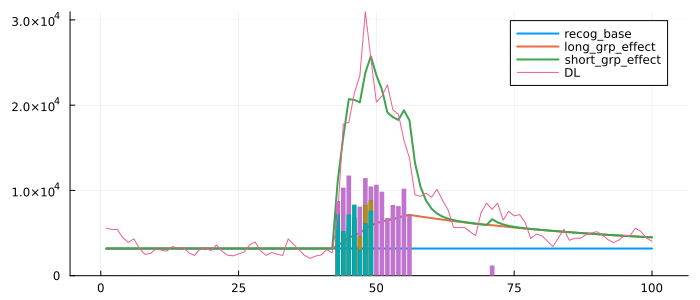

In [15]:
cc_eff_mat = sum(cc_eff,dims=3) |> t-> accumulate(+, t, dims=2) |> t->reshape(t, :, 3) 
plot(cc_eff_mat , label=lb,lw=2)
bar!(mccgrp .* 100, lw=0,label="")
plot!(ccdl,label="DL")

mdist = MixtureModel([Exponential(y) for y = ps.ys], ps.w) = MixtureModel{Exponential{Float64}}(K = 2)
components[1] (prior = 0.4712): Exponential{Float64}(θ=39.46403505594106)
components[2] (prior = 0.5288): Exponential{Float64}(θ=1.7402103969453433)



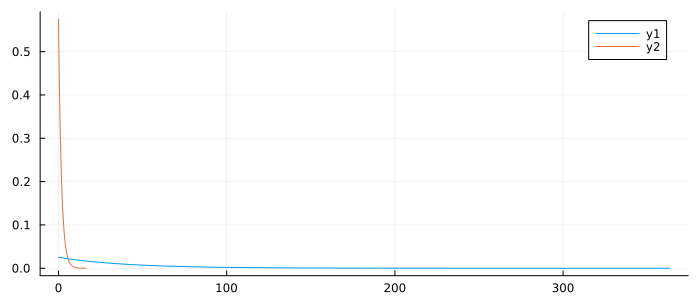

In [16]:
@show mdist = MixtureModel([Exponential(y) for y in ps.ys], ps.w)
plot(mdist)

In [18]:
inference_recognition(ccdl[1:40])

┌ Info: Found initial step size
│   ϵ = 2.9802322387695314e-9
└ @ Turing.Inference /Users/kimseok/.julia/packages/Turing/UCuzt/src/mcmc/hmc.jl:192


(0.09087353687066348, (r = 15.661645202769787, p = 0.0048779654676017435, th = 204.00350128383565, recog = 0.09087353687066348, s = 302.6891290944043))

In [19]:
inference_recognition(ccdl[75:100])

┌ Info: Found initial step size
│   ϵ = 7.450580596923829e-10
└ @ Turing.Inference /Users/kimseok/.julia/packages/Turing/UCuzt/src/mcmc/hmc.jl:192


(0.1992046777337033, (r = 26.191154100359032, p = 0.005406640334126334, th = 183.95774421835873, recog = 0.1992046777337033, s = 262.412807760916))

# 別のデータ　DELISH KITCHEN

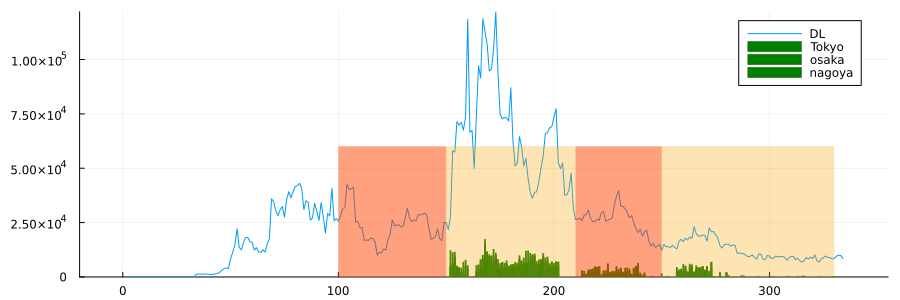

In [20]:
dk =CSV.read("data/Delish_kitchen_dl_tv_ton.csv",DataFrame);
@df dk plot(:TTL,label="DL",size=(900,300))
@df dk bar!([:GRPT, :GRPO, :GRPN] .* 1e2, label=["Tokyo" "osaka" "nagoya"],lw=0, c=:green)
plot!(100:330, x->6e4,fill=(0,0.3, :orange),lw=0,label="")
plot!(210:250, x->6e4,fill=(0,0.3, :red),lw=0,label="")
plot!(100:150, x->6e4,fill=(0,0.3, :red),lw=0,label="")

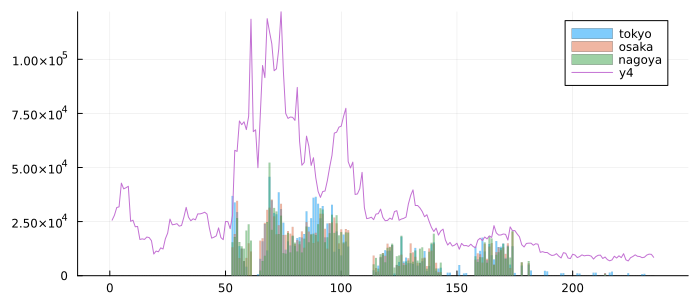

In [21]:
dkdl= dk[100:end,:TTL] ;
mdkgrp=  dk[100:end,[:GRPT, :GRPO, :GRPN]] |> Matrix
ms = [43_000_000 , 20_000_000, 10_000_000];
bar(mdkgrp .* 300, lw=0, alpha=0.5, label=["tokyo" "osaka" "nagoya"])
plot!(dkdl)

In [22]:
model=expmodel(dkdl, mdkgrp, ms)
dkps, dk_chain =analysis(model)

Sampling   0%|                                          |  ETA: N/A


┌ Info: Found initial step size
│   ϵ = 5.820766091346741e-12
└ @ Turing.Inference /Users/kimseok/.julia/packages/Turing/UCuzt/src/mcmc/hmc.jl:192
Sampling   0%|▎                                         |  ETA: 0:19:10


Sampling   1%|▍                                         |  ETA: 0:13:52


Sampling   2%|▋                                         |  ETA: 0:12:28


Sampling   2%|▉                                         |  ETA: 0:59:08


Sampling   2%|█                                         |  ETA: 1:12:33


Sampling   3%|█▎                                        |  ETA: 1:13:08

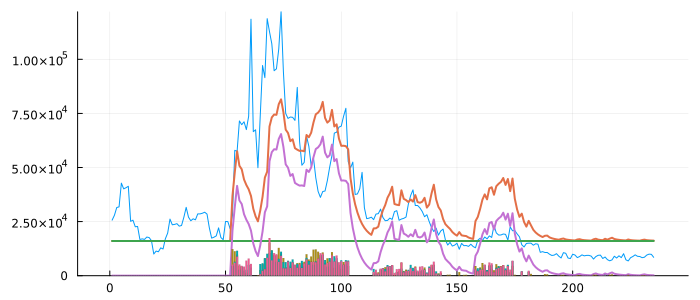

In [189]:
rs, rz = describers(dkdl, mdkgrp, ms, dkps)
#plot(rs)
plot(dkdl, label="dk_dl")
plot!(rs, lw=2, label="rs")
bar!(mdkgrp .* 100, lw=0,legend=false)

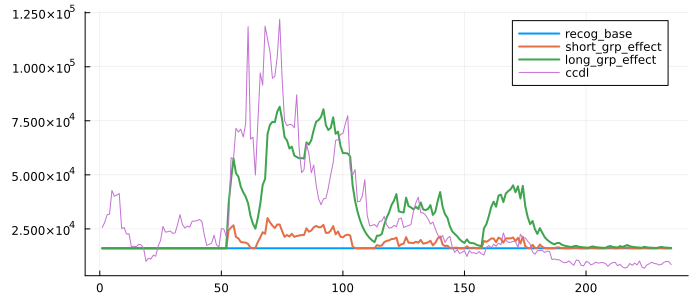

In [190]:
rs_eff, lb = describe_effect(dkdl, mdkgrp, ms, dkps)
rs_eff_mat = sum(rs_eff,dims=3) |> t-> accumulate(+, t, dims=2) |> t->reshape(t, :, 3) 
plot(rs_eff_mat , label=lb,lw=2)
plot!(dkdl, label="ccdl")

mdist = MixtureModel{Exponential{Float64}}(K = 2)
components[1] (prior = 0.1502): Exponential{Float64}(θ=0.4994663505910388)
components[2] (prior = 0.8498): Exponential{Float64}(θ=3.909850341484321)



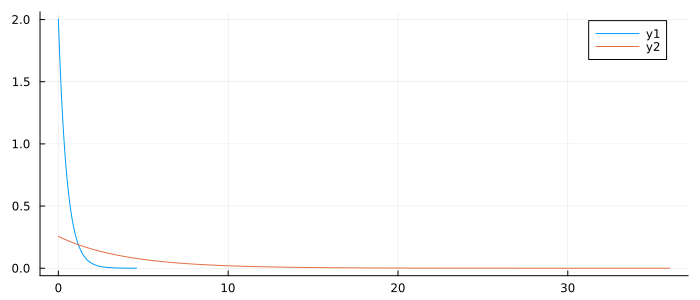

In [191]:
mdist = MixtureModel([Exponential(y) for y in dkps.ys], dkps.w)
@show mdist ;plot(mdist)

In [192]:
ir=inference_recognition(dk[100:150, :TTL])
ir2=inference_recognition(dk[300:end, :TTL])
ir.recog, ir2.recog

┌ Info: Found initial step size
└   ϵ = 5.960464477539063e-9
┌ Info: Found initial step size
└   ϵ = 5.960464477539063e-9


(0.8372875045517133, 0.644925186181363)

In [193]:
dkps.r, ccps.r

([0.0006833602025012249, 9.695892070186818e-6], [0.5012613639818732, 0.015169649295348682])

### Other case; Brave Frontier

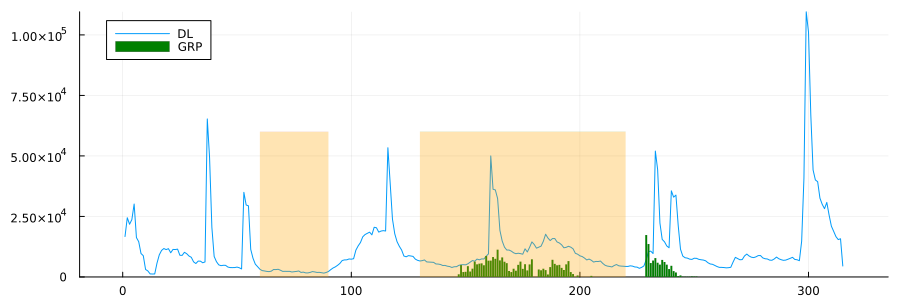

In [216]:
bf = CSV.read("../data/BRAFRO_DL_GRP.csv",DataFrame)  
@df bf plot(:TTL,label="DL",size=(900,300))
@df bf bar!(:GRP .* 1e2, label="GRP",lw=0, c=:green)
plot!(130:220, x->6e4,fill=(0,0.3, :orange),lw=0,label="")
plot!(60:90, x->6e4,fill=(0,0.3, :orange),lw=0,label="")

In [202]:
bf_dl =bf[130:220,:TTL] |> t->[i in 32:36 ? missing : t[i] for i =1:length(t)]
bf_grp =bf[130:220, :GRP];
bf_mgrp = bf[130:220, [:GRP_TOKYO, :GRP_OSAKA, :GRP_NAGOYA]] |> Matrix ;

In [203]:
#model=expdecompose2(bf_dl, bf_grp ; K=2)
model=expdecompose2(bf_dl, bf_mgrp, ms ; K=2)
bfc=sample(model, NUTS(.65), 2000)

┌ Info: Found initial step size
└   ϵ = 9.313225746154786e-11
Sampling: 100%|█████████████████████████████████████████| Time: 0:06:30


Chains MCMC chain (2000×19×1 Array{Float64, 3}):

Iterations        = 1001:1:3000
Number of chains  = 1
Samples per chain = 2000
Wall duration     = 394.34 seconds
Compute duration  = 394.34 seconds
parameters        = s, r[1], r[2], w[1], w[2], ys[1], ys[2]
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters          mean          std       mcse    ess_bulk    ess_tail     ⋯
      Symbol       Float64      Float64    Float64     Float64     Float64   F ⋯

           s      631.4607      13.9703     0.3657   1458.4484   1262.6074     ⋯
        r[1]     2584.4962     357.6749    13.0357    747.3662    813.7974     ⋯
        r[2]   401631.7643   10544.2287   365.3869    844.5173    859.4409     ⋯
        w[1]        0.8806       0.0277     0.0010    717.7566    897.3604     ⋯
        w[2]        0.1194    

In [207]:
bfps= get(bfc, [:r, :w, :ys, :s]) |> t-> (;  ys=[mean(e) for e in t.ys], 
      w=[mean(e) for e in t.w], r=[1/ mean(e) for e in t.r], s=mean(t.s) )

(ys = [14.996402952187328, 0.7511033245212964], w = [0.880644543172459, 0.11935545682754102], r = [0.0003869226063773568, 2.489842908186016e-6], s = 631.4607082906784)

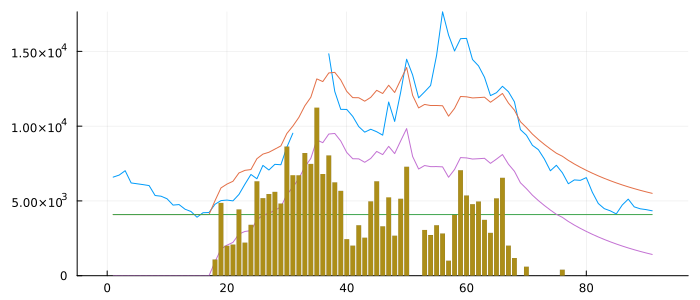

In [210]:
rs,rz= describers(bf_dl, bf_mgrp, ms, bfps)
plot([bf_dl, rs])
bar!(bf_grp .* 100, lw=0,legend=false)

In [211]:
rs

91×3 Matrix{Float64}:
 4085.42  4085.42     0.0
 4085.42  4085.42     0.0
 4085.42  4085.42     0.0
 4085.42  4085.42     0.0
 4085.42  4085.42     0.0
 4085.42  4085.42     0.0
 4085.42  4085.42     0.0
 4085.42  4085.42     0.0
 4085.42  4085.42     0.0
 4085.42  4085.42     0.0
 4085.42  4085.42     0.0
 4085.42  4085.42     0.0
 4085.42  4085.42     0.0
    ⋮              
 7045.44  4085.42  2960.02
 6854.37  4085.42  2768.95
 6675.72  4085.42  2590.3
 6508.62  4085.42  2423.19
 6352.3   4085.42  2266.88
 6206.07  4085.42  2120.64
 6069.27  4085.42  1983.85
 5941.3   4085.42  1855.87
 5821.58  4085.42  1736.15
 5709.58  4085.42  1624.16
 5604.81  4085.42  1519.39
 5506.8   4085.42  1421.37

In [206]:
rs_eff, lb = describe_effect(bf_dl, bf_grp, ms, bfps)
rs_eff_mat = sum(rs_eff,dims=3) |> t-> accumulate(+, t, dims=2) |> t->reshape(t, :, 3) 
plot(rs_eff_mat , label=lb,lw=2)
plot!(bf_dl, label="bf_dl")

LoadError: MethodError: no method matching describe_effect(::Vector{Union{Missing, Int64}}, ::Vector{Float64}, ::Vector{Int64}, ::NamedTuple{(:ys, :w, :r, :s), Tuple{Vector{Float64}, Vector{Float64}, Vector{Float64}, Float64}})

[0mClosest candidates are:
[0m  describe_effect(::Vector, [91m::Matrix[39m, ::Vector, ::Any)
[0m[90m   @[39m [35mMain[39m [90m[4mIn[177]:1[24m[39m


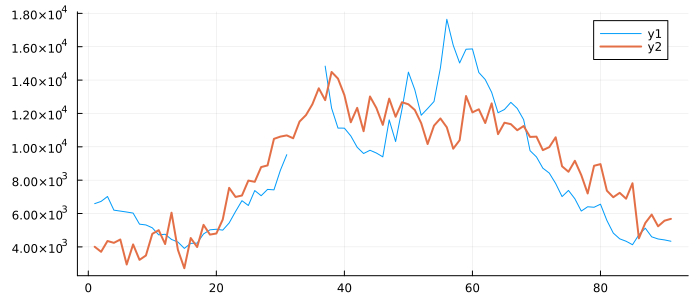

In [67]:
plot(bf_dl) ; plot!(rz, lw=2)

mdist = MixtureModel{Exponential{Float64}}(K = 2)
components[1] (prior = 0.1370): Exponential{Float64}(θ=0.9048409701536002)
components[2] (prior = 0.8630): Exponential{Float64}(θ=15.924815982459975)



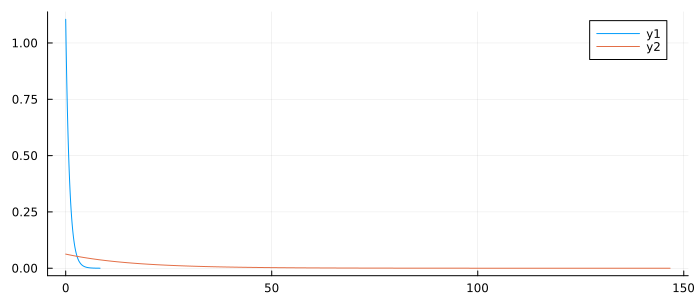

In [68]:
mdist = MixtureModel([Exponential(y) for y in bfps.ys], bfps.w)
@show mdist ; plot(mdist)

In [69]:
ir1=inference_recognition(bf[60:90,:TTL])
ir2=inference_recognition(bf[200:220, :TTL])
ir3=inference_recognition(bf[250:280,:TTL])
ir1.recog,ir2.recog,ir3.recog

┌ Info: Found initial step size
└   ϵ = 9.5367431640625e-8
┌ Info: Found initial step size
└   ϵ = 4.76837158203125e-8
┌ Info: Found initial step size
└   ϵ = 2.9802322387695314e-9


(0.04449700795256594, 0.30240193345860816, 0.3897838791389491)

## Other case; KURASHIRU

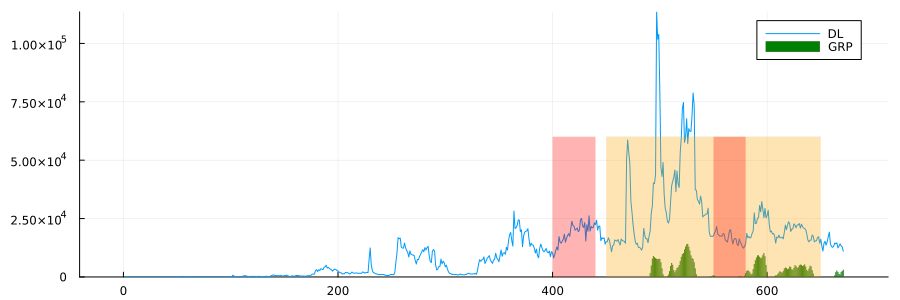

In [70]:
kr = CSV.read("../data/KURASHIRU_GRP_DL.csv",DataFrame)  
@df kr plot(:TTL,label="DL",size=(900,300))
@df kr bar!(:GRP .* 1e2, label="GRP",lw=0, c=:green)
plot!(450:650, x->6e4,fill=(0,0.3, :orange),lw=0,label="")
plot!(550:580, x->6e4,fill=(0,0.3, :red),lw=0,label="")
plot!(400:440, x->6e4,fill=(0,0.3, :red),lw=0,label="")

In [71]:
kr_dl = kr[450:580,:TTL] |> t->[i in 20:25 || i in 48:51 ? missing : t[i] for i =1:length(t)];
kr_grp = kr[450:580,:GRP] ;

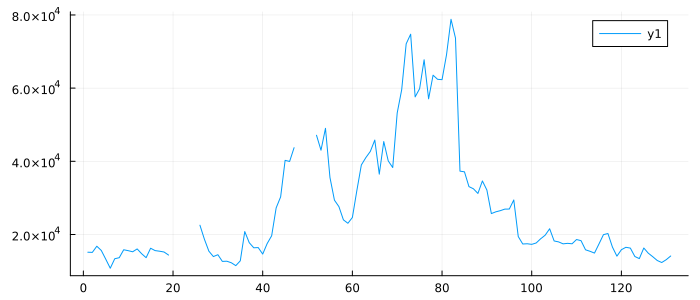

In [72]:
plot(kr_dl)

In [73]:
model=expdecompose2(kr_dl, kr_grp; K=2)
krc=sample(model, NUTS(.65), 2000)

┌ Info: Found initial step size
└   ϵ = 2.9103830456733705e-12
Sampling: 100%|█████████████████████████████████████████| Time: 0:02:01


Chains MCMC chain (2000×19×1 Array{Float64, 3}):

Iterations        = 1001:1:3000
Number of chains  = 1
Samples per chain = 2000
Wall duration     = 122.67 seconds
Compute duration  = 122.67 seconds
parameters        = s, r[1], r[2], w[1], w[2], ys[1], ys[2]
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters          mean         std       mcse   ess_bulk   ess_tail      r ⋯
      Symbol       Float64     Float64    Float64    Float64    Float64   Floa ⋯

           s     1495.1445     18.9331     1.1551   229.8254   528.2166    1.0 ⋯
        r[1]     3148.1649    116.2461    43.6186     7.2944    20.8855    1.2 ⋯
        r[2]   212040.8386   2203.1078   267.6404    70.9353   377.8481    1.0 ⋯
        w[1]        0.6497      0.0181     0.0065     8.8674    15.1935    1.1 ⋯
        w[2]        0.3503    

In [74]:
krps= get(krc, [:r, :w, :ys, :s]) |> t-> (;  ys=[mean(e) for e in t.ys], 
      w=[mean(e) for e in t.w], r=[1/mean(e) for e in t.r], s=mean(t.s))

(ys = [8.634764109824879, 0.25685425479940766], w = [0.6496703549388329, 0.3503296450611671], r = [0.0003176453663350187, 4.716072652558607e-6], s = 1495.144481704005)

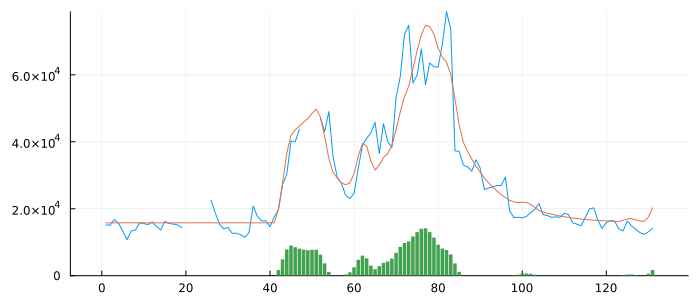

In [75]:
rs,rz= describers2(kr_dl, kr_grp, krps)
plot([kr_dl, rs])
bar!(kr_grp .* 100, lw=0,legend=false)

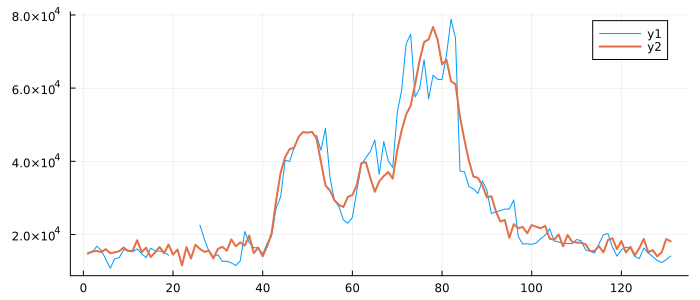

In [76]:
plot(kr_dl) ; plot!(rz, lw=2)

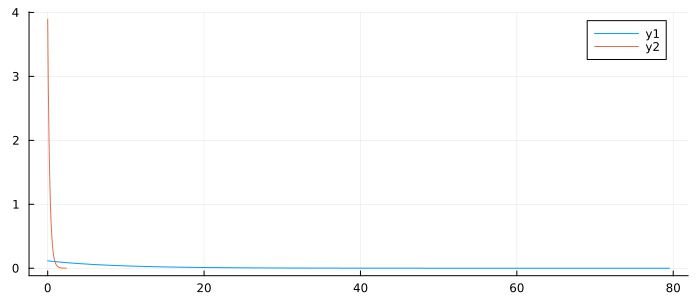

In [77]:
mdist = MixtureModel([Exponential(y) for y in krps.ys], krps.w)
plot(mdist)

In [78]:
ir1=inference_recognition(kr_dl[1:40])
ir2=inference_recognition(kr_dl[100:end])
ir1.recog,ir2.recog

┌ Info: Found initial step size
└   ϵ = 5.960464477539063e-9
┌ Info: Found initial step size
└   ϵ = 5.960464477539063e-9


(0.9493687520705095, 0.951869057020418)

In [79]:
gmdist(r) = MixtureModel([Gamma(r, y/r) for y in krps.ys], krps.w)

gmdist (generic function with 1 method)

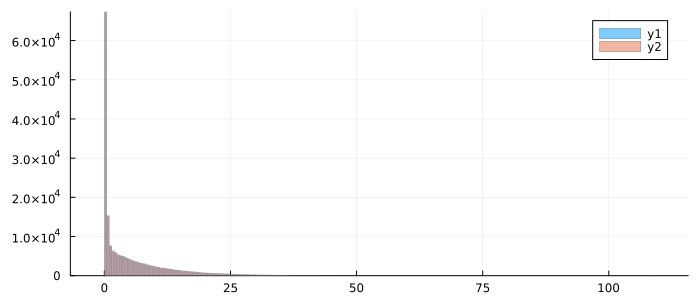

In [80]:
histogram(rand(gmdist(1),200000), alpha=0.5, lw=0)
histogram!(rand(mdist, 200000),alpha=0.5, lw=0)

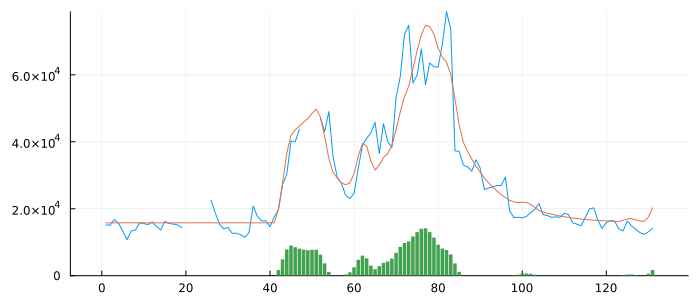

In [81]:
plot([kr_dl, rs])
bar!(kr_grp .* 100, lw=0,legend=false)

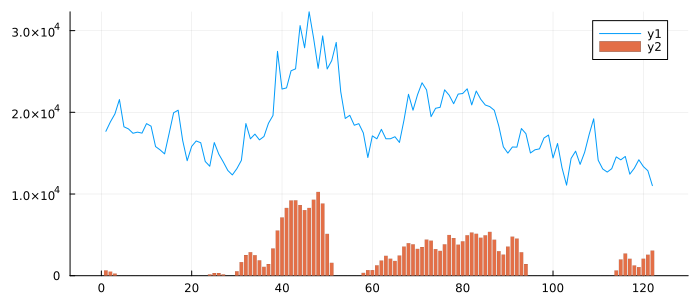

In [82]:
kr_dl2 = kr[550:end,:TTL] #|> t->[i in 20:25 || i in 48:51 ? missing : t[i] for i =1:length(t)];
kr_grp2 = kr[550:end,:GRP] ;
plot(kr_dl2)
bar!(kr_grp2 .* 100, lw=0)

In [83]:
model=expdecompose2(kr_dl2, kr_grp2 ; K=2)
krc2=sample(model, NUTS(.65), 2000)

┌ Info: Found initial step size
└   ϵ = 5.820766091346741e-12
Sampling: 100%|█████████████████████████████████████████| Time: 0:05:20


Chains MCMC chain (2000×19×1 Array{Float64, 3}):

Iterations        = 1001:1:3000
Number of chains  = 1
Samples per chain = 2000
Wall duration     = 324.39 seconds
Compute duration  = 324.39 seconds
parameters        = s, r[1], r[2], w[1], w[2], ys[1], ys[2]
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters          mean          std        mcse   ess_bulk   ess_tail      ⋯
      Symbol       Float64      Float64     Float64    Float64    Float64   Fl ⋯

           s      904.4796      16.1613      1.1434   211.3322   352.1011    1 ⋯
        r[1]     2097.0116     112.5656     18.4306    40.3047    39.5832    1 ⋯
        r[2]   794591.8680   19529.3653   1039.9417   334.5718   504.6042    1 ⋯
        w[1]        0.8842       0.1501      0.0374    19.0426    45.7031    1 ⋯
        w[2]        0.1158    

In [84]:
krps2= get(krc2, [:r, :w, :ys, :s]) |> t-> (;  ys=[mean(e) for e in t.ys], 
      w=[mean(e) for e in t.w], r=[1/mean(e) for e in t.r], s=mean(t.s))

(ys = [3.219309620842557, 27.018784779320335], w = [0.8842379717073509, 0.11576202829264907], r = [0.00047686908774372693, 1.2585077198860128e-6], s = 904.479562237868)

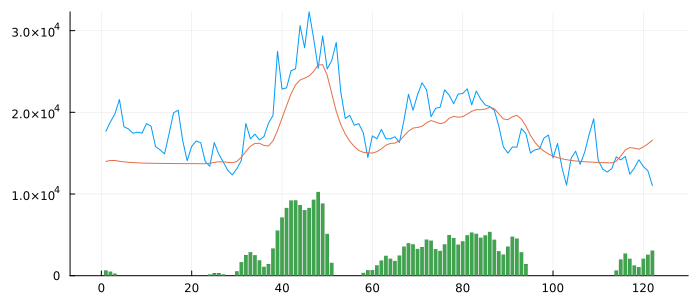

In [85]:
rs,rz= describers2(kr_dl2, kr_grp2, krps2)
plot([kr_dl2, rs])
bar!(kr_grp2 .* 100, lw=0,legend=false)

mdist2 = MixtureModel{Exponential{Float64}}(K = 2)
components[1] (prior = 0.8842): Exponential{Float64}(θ=3.219309620842557)
components[2] (prior = 0.1158): Exponential{Float64}(θ=27.018784779320335)



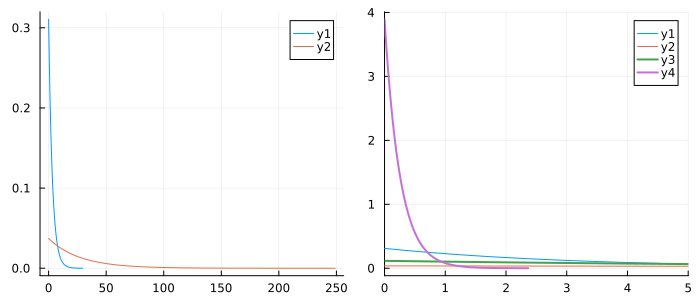

In [86]:
mdist2 = MixtureModel([Exponential(y) for y in krps2.ys], krps2.w)
@show mdist2
pl1=plot(mdist2)
pl2=plot(mdist2) ; plot!(pl2,mdist, lw=2 ,xlims=(0,5))
plot(pl1,pl2)

# 大量のCM認知者によって行動DLが誘発される　DLまでの時間を知りたい。

In [87]:
recog_action(m, rg, dtime) = m * rg * cdf(Exponential(dtime), 1.0)
grp_action(u, grp_array, dtime ,i) = [u * grp_array[k] *( cdf(Exponential(dtime), i-k+1) - cdf(Exponential(dtime), i-k) ) for k = 1:i] |> sum

grp_action (generic function with 1 method)

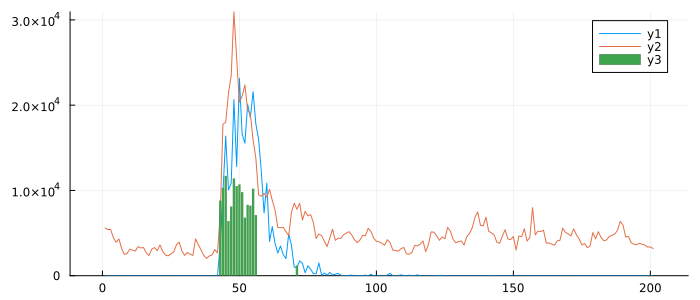

In [88]:
m = 120_000_000
cc_grn = (cc_grp ./100 )./ mean(tbbeta) |> t->round.(t)
ac_grn = accumulate(+, cc_grn) |> t-> [cc_grn[i] == 0 ? 0 : ac_grn[i] for i = 1:length(cc_grn)]

precm_recog = 0.1
tgamma = Gamma(23.7,179)
#rand_exp(;n=120_000_000) = rand(tgamma) |> t-> n * cdf(Exponential(t),1)
dl = [recog_action(m, precm_recog, rand(tgamma)) for i = 1:length(cc_grp)]
dl_tv = [grp_action(m*0.0002, cc_grp ./ 100, rand(Gamma(5, 1.22 )), i) for i = 1:length(cc_grp)]
test_dl =  dl_tv  #.+ dl
plot([test_dl , cc_dl])
bar!(cc_grp .* 100, lw=0)

In [89]:
@model function expaction(m, dl, delay)
    recog ~  truncated(TDist(3), 0.00001, 0.99999)
    s ~ Exponential(1)
    dl ~ Normal( m * recog * cdf(Exponential(delay), 1.0), s)
    return recog
end

expaction (generic function with 2 methods)

In [90]:
#grp_nbaction(u, grp_array, nb ,i) = [u * grp_array[k] *( cdf(nb, i-k+1) - cdf(nb, i-k) ) for k = 1:i] |> sum
integrate_grp(m, grp, rn) =  ( sum( m .* grp) - rn) / m 
@model function delayedarrival(dl, grp , basedist ; n = length(dl), m =120_000_000, J=43)
    rg ~ truncated(TDist(3), 0.00001, 0.5)
    #k ~ truncated(TDist(3), 0.00001, 0.5)
    
    #Gamma dist
    r ~ InverseGamma(2,3)
    th ~ truncated(TDist(3), 0.001, 0.999)
    s ~ InverseGamma(2,3)
    for i = 1:J-1  
        g ~ Gamma(basedist.α, basedist.θ)
        r1 = recog_action(m, rg, g)
        dl[i] ~ Normal( r1 , s)
    end
    
    for i = J:n
        y = mean(grp[1:J-1])
        k = integrate_grp(m, grp, y*n)
        
        d ~ Gamma(r, 1/th)
        r2 = grp_action( m * k , cc_grp, d , i)
        
        dl[i] ~ Normal( y + r2 , s)        
    end
end

delayedarrival (generic function with 2 methods)

In [91]:
cdf(NegativeBinomial(12,0.6), 1),cdf(NegativeBinomial(12,0.6), 2)

(0.01262533754879999, 0.03979158110207997)

In [92]:
model = delayedarrival(test_dl, cc_grp ./100 , tgamma)
c_dl = sample(model, NUTS(0.65), 2000)

┌ Info: Found initial step size
└   ϵ = 1.1641532182693482e-11
Sampling: 100%|█████████████████████████████████████████| Time: 1:02:42


Chains MCMC chain (2000×18×1 Array{Float64, 3}):

Iterations        = 1001:1:3000
Number of chains  = 1
Samples per chain = 2000
Wall duration     = 3771.83 seconds
Compute duration  = 3771.83 seconds
parameters        = rg, r, th, s, g, d
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters             mean             std            mcse   ess_bulk   ess ⋯
      Symbol          Float64         Float64         Float64    Float64    Fl ⋯

          rg           0.4145          0.0001          0.0000     7.3421    21 ⋯
           r    93266788.4501   15614850.9390    6870875.8487     7.1407    15 ⋯
          th           0.2007          0.0001          0.0000     7.1823    24 ⋯
           s        7703.8886        987.5575        427.2306     5.6600    15 ⋯
           g        4424.9793          4.9724    

In [93]:
ps = get(c_dl, [:rg, :th, :r]) |> t-> (; r = mean(t.r), th= 100/ mean(t.th), rg = mean(t.rg) )
#ps = get(c_dl, [:rg ]) |> t-> (;rg = mean(t.rg) )

(r = 9.326678845007907e7, th = 498.23667579115573, rg = 0.4145254601139351)

In [94]:
rs = zeros(length(cc_grp))
m = 120_000_000
for i = 1:length(rs)
    dl, dl_tv = 0, 0
    dl    = recog_action(m, ps.rg, rand(tgamma)) 
    
    y = mean(grp[1:42])
     k = integrate_grp(m, grp, y*43)
    dl_tv = grp_action(m * k, cc_grp ./ 100, rand(Gamma(ps.r, ps.th)), i)
    rs[i] = dl + dl_tv
end

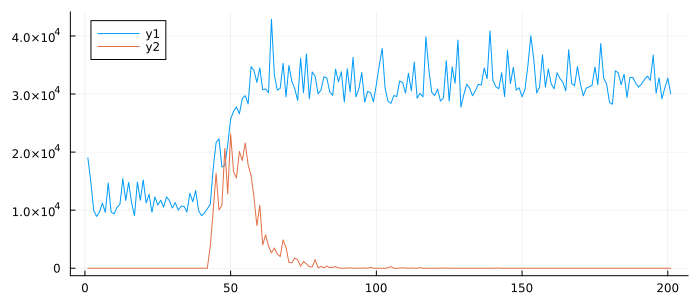

In [95]:
plot([rs, test_dl])

In [96]:
@model function expaction(cc_dl, tdist ; n = length(dl))
    fq ~ Poisson(4)
    λ ~ InverseGamma(2,3)
    reach = reach_func(fq)
    s ~ Exponential(1)
    for i = 1:n
        
        ys = dl[i] + sum_ta(m, reach, Exponential(4), i)
        cc_dl[i] ~ Normal(ys,s)
    end
end
    

expaction (generic function with 4 methods)

In [97]:
model = expaction(cc_dl)
c = sample(model, NUTS(.65), 2000, proress=false)

LoadError: MethodError: no method matching expaction(::Vector{Int64})

[0mClosest candidates are:
[0m  expaction(::Any, [91m::Any[39m; n)
[0m[90m   @[39m [35mMain[39m [90m[4mIn[96]:1[24m[39m
[0m  expaction(::Any, [91m::Any[39m, [91m::Any[39m)
[0m[90m   @[39m [35mMain[39m [90m[4mIn[89]:1[24m[39m
[0m  expaction([91m::DynamicPPL.Model[39m, [91m::DynamicPPL.AbstractVarInfo[39m, [91m::AbstractPPL.AbstractContext[39m, [91m::Any[39m, [91m::Any[39m; n)
[0m[90m   @[39m [35mMain[39m [90m[4mIn[96]:1[24m[39m
[0m  ...


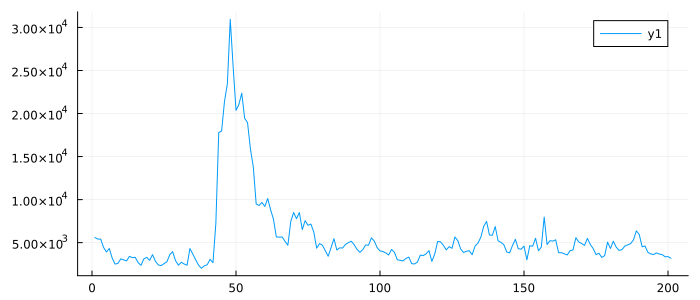

In [98]:
plot(cc_dl )

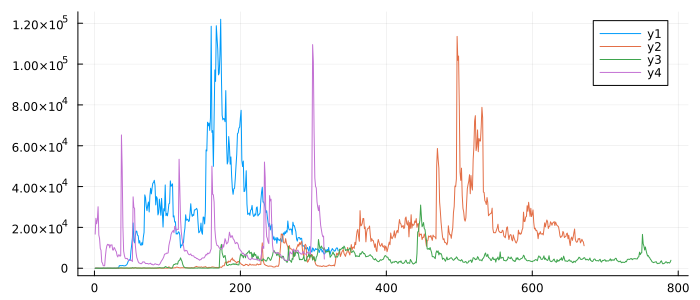

In [99]:
plot([dk[:,:TTL], kr[:,:TTL], cc_df[:,:TTL], bf[:,:TTL]])

In [100]:
ir=inference_recognition(kr[400:500,:TTL])
ir.recog

┌ Info: Found initial step size
└   ϵ = 4.76837158203125e-8


0.8462098650318711

In [101]:
ir=inference_recognition(dk[50:60, :TTL])
ir.recog

┌ Info: Found initial step size
└   ϵ = 4.76837158203125e-8


0.9091938729654182